In [41]:
import pandas as pd
import numpy as np
import math

import geopandas as gpd
from shapely.geometry import Point

import matplotlib.pyplot as plt
import seaborn as sns
from branca.element import Element
import folium
from folium import Map, Marker, Choropleth, CircleMarker
from folium.plugins import MarkerCluster, HeatMap
import cartopy.crs as ccrs

from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    classification_report, 
    confusion_matrix, 
    ConfusionMatrixDisplay,
    roc_auc_score, 
    roc_curve
)

import os
import asyncio
import warnings

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',None)

In [42]:
data = pd.read_csv("DataCoSupplyChainDatasetRefined.csv", header=0)
data.head()

,type,days_for_shipping_real,days_for_shipment_scheduled,benefit_per_order,sales_per_customer,delivery_status,late_delivery_risk,category_id,category_name,customer_city,customer_country,customer_email,customer_fname,customer_id,customer_lname,customer_password,customer_segment,customer_state,customer_street,customer_zipcode,department_id,department_name,latitude_src,longitude_src,market,order_city,order_country,order_customer_id,order_date_dateorders,order_id,order_item_cardprod_id,order_item_discount,order_item_discount_rate,order_item_id,order_item_product_price,order_item_profit_ratio,order_item_quantity,sales,order_item_total,order_profit_per_order,order_region,order_state,order_status,order_zipcode,product_card_id,product_category_id,product_image,product_name,product_price,product_status,shipping_date_dateorders,shipping_mode,order_country_en,order_state_en,order_city_en,latitude_dest,longitude_dest,address_dest
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,20755,1/31/2018 22:56,77202,1360,13.110000,0.04,180517,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class,Indonesia,West Java,Bekasi,-6.238270,106.975573,"Bekasi, West Java, Indonesia"
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,19492,1/13/2018 12:27,75939,1360,16.389999,0.05,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class,India,Rajasthan,Bikaner,28.022935,73.311916,"Bikaner, Rajasthan, India"
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,19491,1/13/2018 12:06,75938,1360,18.030001,0.06,179253,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class,India,Rajasthan,Bikaner,28.022935,73.311916,"Bikaner, Rajasthan, India"
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.0,2,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,19490,1/13/2018 11:45,75937,1360,22.940001,0.07,179252,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,NaN,1360,73,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class,Australia,Queensland,Townsville,-19.258964,146.816948,"Townsville City QLD 4810, Australia"
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,19489,Hendricks,XXXXXXXXX,Corporate,PR,8671 Iron Anchor Corners,725.0,2,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,19489,1/13/2018 11:24,75936,1360,29.500000,0.09,179251,327.75,0.45,1,327.75,298.250000,134.210007,Oceania,Queensland,PENDING_PAYMENT,NaN,1360,73,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class,Australia,Queensland,Townsville,-19.258964,146.816948,"Townsville City QLD 4810, Australia"


In [43]:
shape = data.shape
print(f"The DataCo supply chain dataset consists of {shape[0]} records, having {shape[1]} attributes in total.")

The DataCo supply chain dataset consists of 180519 records, having 58 attributes in total.


In [44]:
irrelevant_columns = ["customer_email", "customer_password", "product_image"]
data = data.drop(columns=irrelevant_columns, errors='ignore')

In [45]:
missing_summary = data.isnull().sum()
print(f"Missing Values Summary:\n{missing_summary[missing_summary>0]}")

Missing Values Summary:
customer_lname           8
customer_zipcode         3
order_zipcode       155679
dtype: int64


In [46]:
data.customer_lname.fillna(value="", inplace=True)
data.dropna(subset=['customer_zipcode'], inplace=True)
data.dropna(axis=1, inplace=True)

In [47]:
date_columns = ["order_date_dateorders", "shipping_date_dateorders"]
for col in date_columns:
    data[col] = pd.to_datetime(data[col], errors='coerce')

data['order_day_of_week'] = data['order_date_dateorders'].dt.dayofweek
data['shipping_day_of_week']= data['shipping_date_dateorders'].dt.dayofweek
data['shipping_delay'] = data.days_for_shipping_real - data.days_for_shipment_scheduled

data.drop(columns=date_columns, inplace=True) 

In [48]:
useful_cat_cols = ['type', 'customer_segment']
data = pd.get_dummies(data, columns=useful_cat_cols, dtype=int)

In [49]:
# Standardising the column names again after encoding
data.columns = data.columns.str.lower().str.strip().str.replace(' ', '_').str.replace(r'[()]', '', regex=True) 
data.filter(regex='*|'.join(useful_cat_cols)).head()


,type_cash,type_debit,type_payment,type_transfer,customer_segment_consumer,customer_segment_corporate,customer_segment_home_office
0,0,1,0,0,1,0,0
1,0,0,0,1,1,0,0
2,1,0,0,0,1,0,0
3,0,1,0,0,0,0,1
4,0,0,1,0,0,1,0


In [50]:
shipping_priority = ['Same Day', 'First Class', 'Second Class', 'Standard Class']
shipping_mapping = {mode: idx for idx, mode in enumerate(shipping_priority)}

data.shipping_mode = data.shipping_mode.map(shipping_mapping)

In [51]:
quantitative_columns = [
    'benefit_per_order', 'days_for_shipping_real', 'days_for_shipment_scheduled',
    'sales_per_customer', 'order_item_discount', 'order_item_product_price',
    'order_item_profit_ratio', 'order_item_quantity', 'sales',
    'order_item_total', 'order_profit_per_order', 'product_price'
]

scaler = StandardScaler()
data[quantitative_columns] = scaler.fit_transform(data[quantitative_columns])

In [52]:
# world_filepath = gpd.datasets.get_path('naturalearth_lowres')

# world = gpd.read_file(world_filepath)
# gdf_src_points = gpd.read_file('src_points.geojson')
# gdf_dest_points = gpd.read_file('dest_points.geojson')
# gdf_routes = gpd.read_file('routes.geojson')
import geopandas as gpd
import geodatasets

# Load world map dataset using geodatasets
world_filepath = geodatasets.get_path("naturalearth.land")
world = gpd.read_file(world_filepath)

# Load your GeoJSON files
gdf_src_points = gpd.read_file('src_points.geojson')
gdf_dest_points = gpd.read_file('dest_points.geojson')
gdf_routes = gpd.read_file('routes.geojson')

# Print a summary
print(world.head())
print(gdf_src_points.head())
print(gdf_dest_points.head())
print(gdf_routes.head())



  featurecla  scalerank  min_zoom  \
0       Land          1       1.0   
1       Land          1       1.0   
2       Land          1       0.0   
3       Land          1       1.0   
4       Land          1       1.0   

                                            geometry  
0  POLYGON ((-59.57209 -80.04018, -59.86585 -80.5...  
1  POLYGON ((-159.20818 -79.49706, -161.1276 -79....  
2  POLYGON ((-45.15476 -78.04707, -43.92083 -78.4...  
3  POLYGON ((-121.21151 -73.50099, -119.91885 -73...  
4  POLYGON ((-125.55957 -73.48135, -124.03188 -73...  
                      geometry
0   POINT (-66.03706 18.25145)
1   POINT (-66.03706 18.27945)
2  POINT (-121.88128 37.29223)
3  POINT (-118.29102 34.12595)
4   POINT (-66.03705 18.25377)
                      geometry
0   POINT (106.97557 -6.23827)
1    POINT (73.31192 28.02293)
2    POINT (73.31192 28.02293)
3  POINT (146.81695 -19.25896)
4  POINT (146.81695 -19.25896)
                                            geometry
0  LINESTRING (-66.037

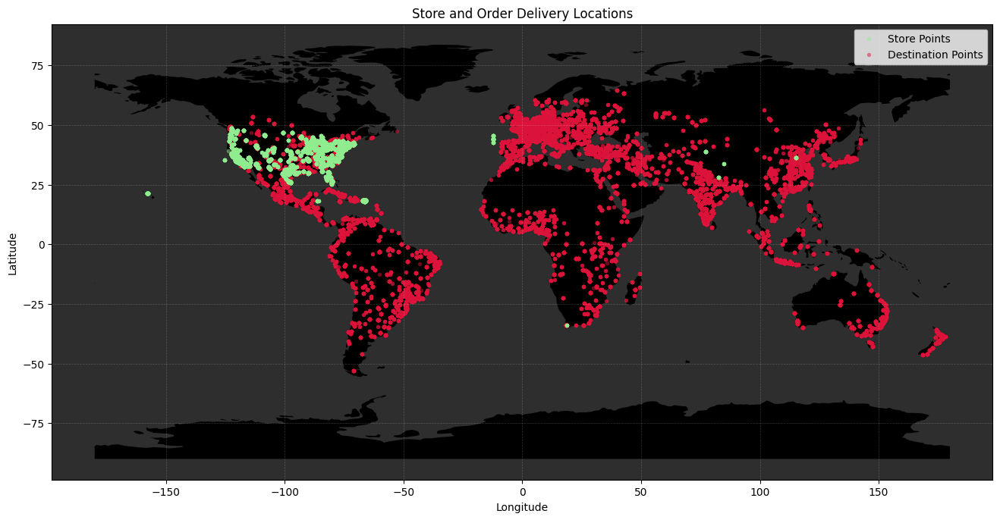

In [53]:
fig, ax = plt.subplots(figsize=(16, 12))
world.plot(ax=ax, color="black")
gdf_src_points.plot(ax=ax, marker='o', 
                    color='lightgreen',
                    alpha=0.5,
                    label='Store Points', 
                    markersize=15,
                    lw=0,
                    zorder=2)
gdf_dest_points.plot(ax=ax, marker='o', 
                     color='crimson', 
                     alpha=0.5,
                     label='Destination Points', 
                     markersize=15, 
                     lw=0,
                     zorder=1)
plt.legend()
ax.set_facecolor('#2e2e2e')
plt.title('Store and Order Delivery Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, color='white', alpha=0.2, linestyle='--', linewidth=0.5) 
plt.show()


In [54]:
print(world.columns)


Index(['featurecla', 'scalerank', 'min_zoom', 'geometry'], dtype='object')


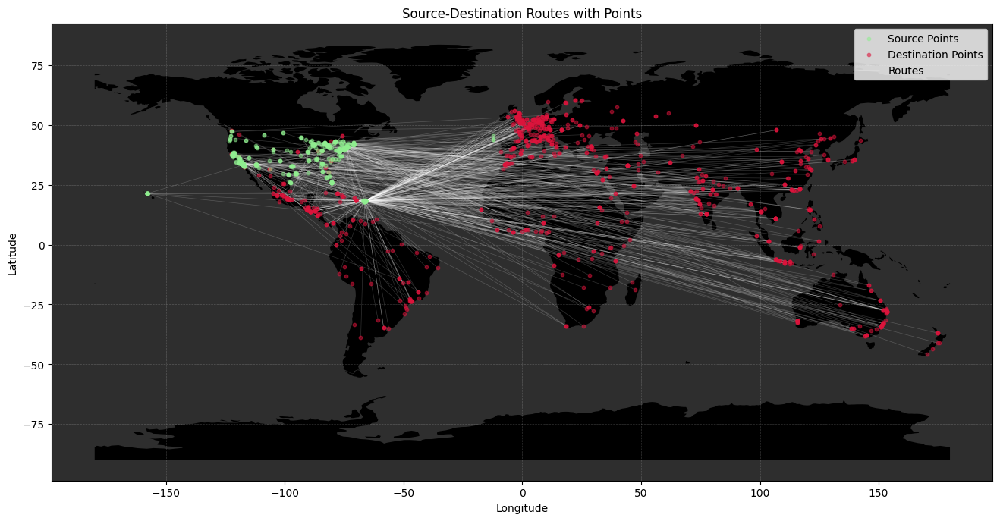

In [55]:

fig, ax = plt.subplots(figsize=(16, 14))
n = 1000
world.plot(ax=ax, color="black")

gdf_src_points[:n].plot(ax=ax, marker='o', 
                    color='lightgreen',
                    alpha=0.5,
                    label='Source Points', 
                    markersize=10,
                    zorder=3)
gdf_dest_points[:n].plot(ax=ax, marker='o', 
                     color='crimson', 
                     alpha=0.5,
                     label='Destination Points', 
                     markersize=10, 
                     zorder=2)
gdf_routes[:n//2].plot(ax=ax, color='white', linewidth=0.5, alpha=0.2, label='Routes', zorder=1)

plt.legend()
plt.title('Source-Destination Routes with Points')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

ax.set_facecolor('#2e2e2e')  # Set dark background color for the plot
plt.grid(True, color='white', alpha=0.2, linestyle='--', linewidth=0.5) 
plt.show()

In [56]:
new_world = gpd.read_file('ne_110m_admin_0_countries')

In [57]:
aggregated_delay = pd.merge(
    data.groupby('order_country_en')[['shipping_delay']].mean().round(2).reset_index(),
    new_world[['ADMIN', 'geometry']],
    left_on='order_country_en',
    right_on='ADMIN',
    how='left'
)

aggregated_delay = gpd.GeoDataFrame(aggregated_delay, geometry='geometry')

aggregated_delay['latitude'] = aggregated_delay.geometry.centroid.y
aggregated_delay['longitude'] = aggregated_delay.geometry.centroid.x

aggregated_delay = aggregated_delay.rename(
    columns={'order_country_en': 'country', 'shipping_delay': 'average_shipping_delay'}
)

aggregated_delay.dropna(inplace=True)

In [58]:
# new_world = gpd.read_file('ne_110m_admin_0_countries')

In [59]:
print(new_world.columns)

Index(['featurecla', 'scalerank', 'LABELRANK', 'SOVEREIGNT', 'SOV_A3',
       'ADM0_DIF', 'LEVEL', 'TYPE', 'TLC', 'ADMIN',
       ...
       'FCLASS_TR', 'FCLASS_ID', 'FCLASS_PL', 'FCLASS_GR', 'FCLASS_IT',
       'FCLASS_NL', 'FCLASS_SE', 'FCLASS_BD', 'FCLASS_UA', 'geometry'],
      dtype='object', length=169)


In [60]:
# Helper function
def add_map_title(folium_map, title, position="top", alignment="center"):
    """
    Adds a title to a Folium map.
    
    Parameters:
        folium_map (folium.Map): The map to which the title will be added.
        title (str): The text of the title.
        position (str): The vertical position of the title ("top" or "bottom").
        alignment (str): The horizontal alignment of the title ("left", "center", "right").
    """
    alignment_map = {
        "left": "left: 80px; margin-left: 0;",
        "center": "left: 50%; margin-left: -150px;",
        "right": "right: 10px; margin-left: 0;"
    }
    position_map = {
        "top": "top: 10px;",
        "bottom": "bottom: 10px;"
    }
    
    # Get alignment and position styles
    align_style = alignment_map.get(alignment, alignment_map["center"])
    pos_style = position_map.get(position, position_map["top"])
    
    # Create the HTML template
    title_html = f'''
    <div style="position: fixed; 
                {pos_style} {align_style} 
                width: 300px; text-align: center; 
                font-size: 16px; font-weight: bold; 
                z-index: 9999; background-color: white; padding: 5px 10px; 
                border: 2px solid lightgray; border-radius: 10px;">
        {title}
    </div>
    '''
    # Add the title to the map
    folium_map.get_root().html.add_child(Element(title_html))

In [61]:
aggregated_delay
df = pd.DataFrame(aggregated_delay)

# Save DataFrame to CSV
df.to_csv('aggregated_delay.csv', index=False)  # Set index=False to avoid saving the index column

print("CSV file saved successfully!")

CSV file saved successfully!


In [62]:
m_2 = folium.Map(location=[20.9614, 6.6797], tiles="cartodb darkmatter", zoom_start=2)

from matplotlib import cm, colors
min_delay = aggregated_delay['average_shipping_delay'].min()
max_delay = aggregated_delay['average_shipping_delay'].max()
norm = colors.Normalize(vmin=min_delay, vmax=max_delay)
cmap = cm.get_cmap('RdYlGn_r')

def get_color(delay):
    rgba = cmap(norm(delay)) 
    return colors.to_hex(rgba)
    
for idx,row in aggregated_delay.iterrows():
    delay = row.average_shipping_delay
    if not delay:
        continue
    CircleMarker(
        location=[row.latitude, row.longitude],
        radius=2+12*abs(delay),
        tooltip=f'Country: {row.country}, Avg. Shipping Delay: {delay} Days',
        color=get_color(delay),
        fill=True,
        fill_opacity=0.8,
        stroke=True,
        weight=0.5
    ).add_to(m_2)
add_map_title(m_2, "Global Shipping Delay Map")
m_2

In [63]:
m_2 = folium.Map(location=[20.9614, 6.6797], tiles="cartodb darkmatter", zoom_start=2)

cp = Choropleth(
    geo_data =aggregated_delay.__geo_interface__,
    data = aggregated_delay.average_shipping_delay,
    key_on = 'feature.id',
    fill_color = "RdBu_r", 
    line_color = 'black',
    fill_opacity = 1,
    legend_name='Average Shipping Delay (days)',
).add_to(m_2)

add_map_title(m_2, title="Average Shipping Delay by Country", position='top', alignment='left')

folium.GeoJsonTooltip(
    fields=['country', 'average_shipping_delay'],
    aliases=['Country:', 'Avg. Shipping Delay (days):'],
).add_to(cp.geojson)  

m_2

In [64]:

filtered_data = data[['latitude_dest', 'longitude_dest', 'order_profit_per_order']].dropna()

heatmap_data = filtered_data.values.tolist()

m_3 = folium.Map(location=[20.9614, 6.6797], tiles="cartodb darkmatter", zoom_start=2)

HeatMap(
    data=heatmap_data,
    radius=15,
    blur=15,
).add_to(m_3)

add_map_title(m_3, title="Profitability Heatmap", position='top')

m_3

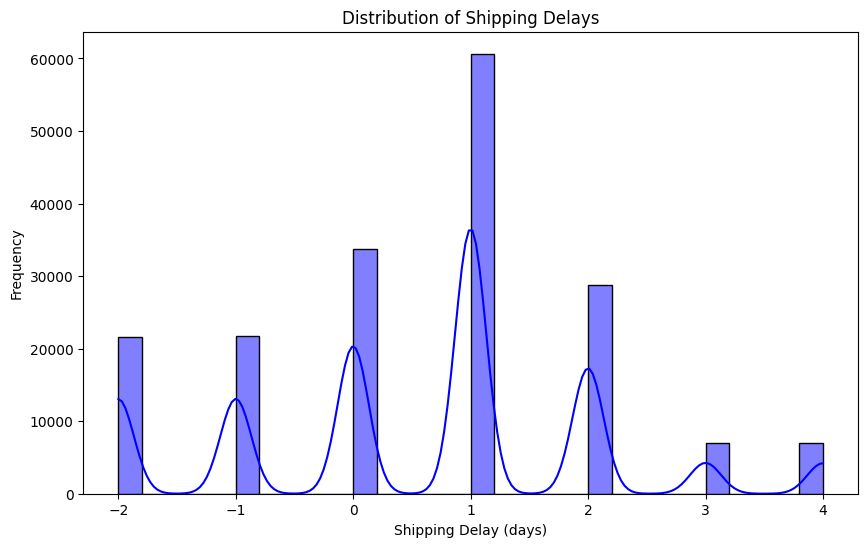

In [65]:

plt.figure(figsize=(10, 6))
sns.histplot(data['shipping_delay'], bins=30, kde=True, color='blue')
plt.title("Distribution of Shipping Delays")
plt.xlabel("Shipping Delay (days)")
plt.ylabel("Frequency");

In [66]:
target = data['late_delivery_risk']

useless_num = [
    'category_id', 'customer_id', 'customer_zipcode', 'department_id',
    'order_id', 'order_item_cardprod_id', 'order_item_id', 'order_customer_id', 
    'product_card_id', 'product_category_id', 'product_status',
    'latitude_src', 'longitude_src', 'latitude_dest', 'longitude_dest'
]

useless_cat = [
    'category_name', 'customer_city', 'customer_country', 'customer_fname',
    'customer_lname','customer_state', 'customer_street',
    'order_status', 'order_region', 'order_state', 'order_city', 'order_country',
    'product_name', 'department_name', 'market', 'delivery_status', 'address_dest',
    'order_country_en', 'order_state_en', 'order_city_en'
]

useless_features = useless_cat + useless_num

features = data.drop(columns=['late_delivery_risk']+useless_features, errors='ignore')
print(features.shape)

(180516, 24)


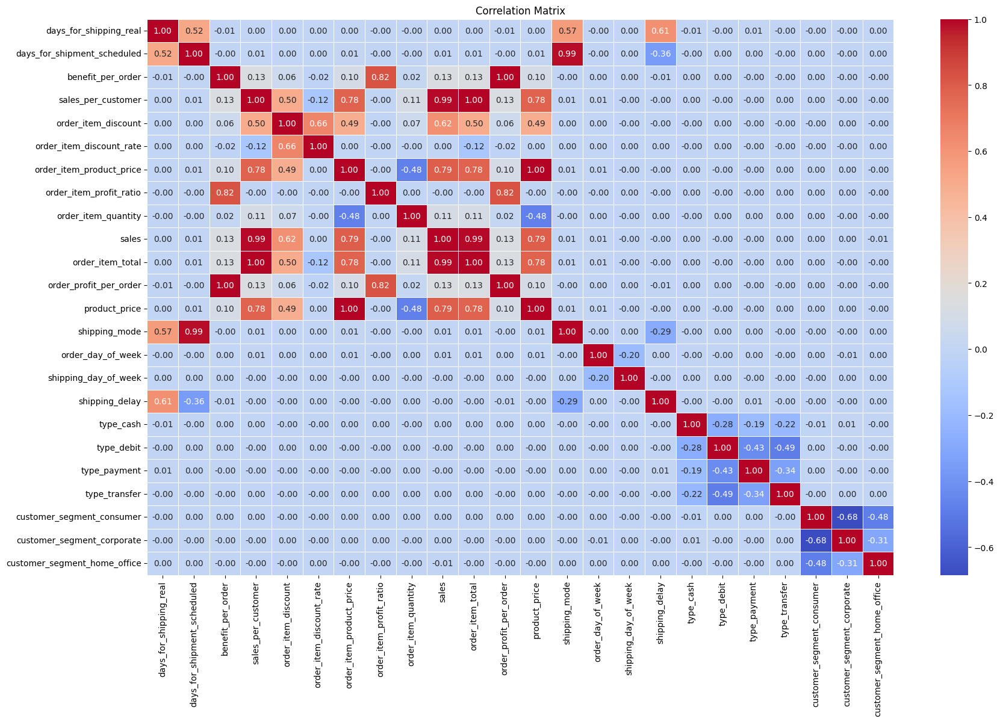

In [67]:
correlation_matrix = features.corr()
plt.figure(figsize=(20, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [68]:
features.drop(columns=[
    'shipping_delay',
    'days_for_shipping_real',
    'shipping_mode',
    'benefit_per_order', 
    'sales_per_customer',
    'order_item_total',
    'order_item_product_price', 
], inplace=True, errors='ignore')

In [78]:
features.drop(columns=[ 'order_item_discount',
       'order_item_discount_rate', 'order_item_profit_ratio',
       'order_item_quantity', 'sales', 'order_profit_per_order',
       'product_price', 
       'type_cash', 'type_debit', 'type_payment', 'type_transfer',
       'customer_segment_consumer', 'customer_segment_corporate',
       'customer_segment_home_office'],inplace=True, errors='ignore')

In [79]:
features.head()

,days_for_shipment_scheduled,order_day_of_week,shipping_day_of_week
0,0.777154,2,5
1,0.777154,5,3
2,0.777154,5,2
3,0.777154,5,1
4,0.777154,5,0


In [80]:
target.head()

0    0
1    1
2    0
3    0
4    0
Name: late_delivery_risk, dtype: int64

In [81]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state=42, stratify=target)

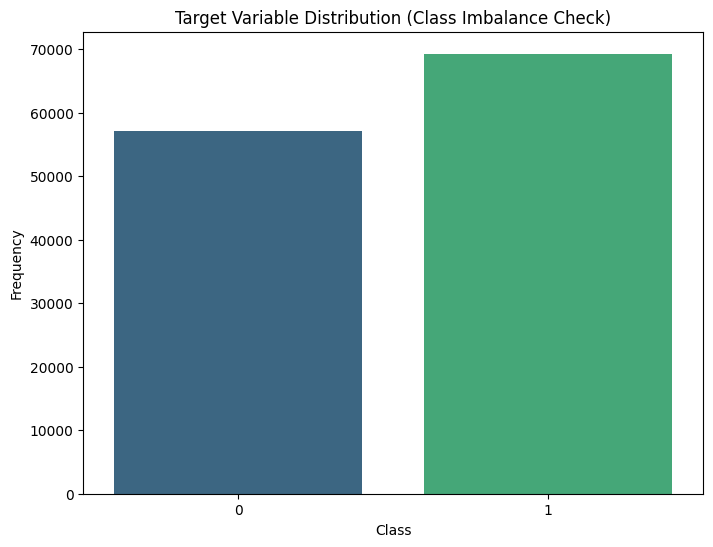

Target Variable Class Distribution:
late_delivery_risk
1    69283
0    57078
Name: count, dtype: int64


In [82]:
target_distribution = y_train.value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(x=target_distribution.index, y=target_distribution.values, palette='viridis')
plt.title('Target Variable Distribution (Class Imbalance Check)')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

print("Target Variable Class Distribution:")
print(target_distribution)

In [83]:
clf = RandomForestClassifier(n_estimators=75,
                             random_state=42,
                             criterion='entropy',
                             class_weight='balanced')
clf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       n_estimators=75, random_state=42)

In [84]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_scores = cross_val_score(clf, features, target, cv=cv, scoring='accuracy')

print(f"Cross-validation scores: {cv_scores}")
print(f"Mean accuracy: {cv_scores.mean():.4f}")
print(f"Standard deviation: {cv_scores.std():.4f}")

Cross-validation scores: [0.97559827 0.97440656 0.97537601 0.97562529 0.97648395]
Mean accuracy: 0.9755
Standard deviation: 0.0007


Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.95      0.97     24462
           1       0.96      1.00      0.98     29693

    accuracy                           0.98     54155
   macro avg       0.98      0.97      0.98     54155
weighted avg       0.98      0.98      0.98     54155



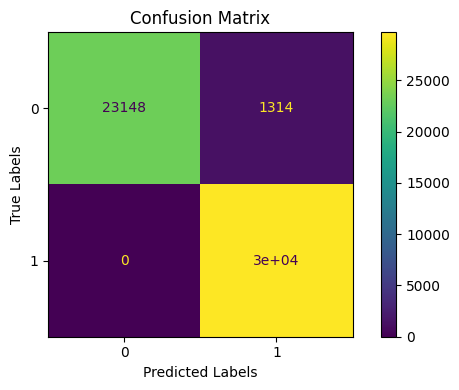

In [85]:
y_pred = clf.predict(X_test)

print("Classification Report:\n", classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot(colorbar=True, ax=plt.gca())
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.tight_layout()
plt.show()

ROC-AUC Score: 0.98


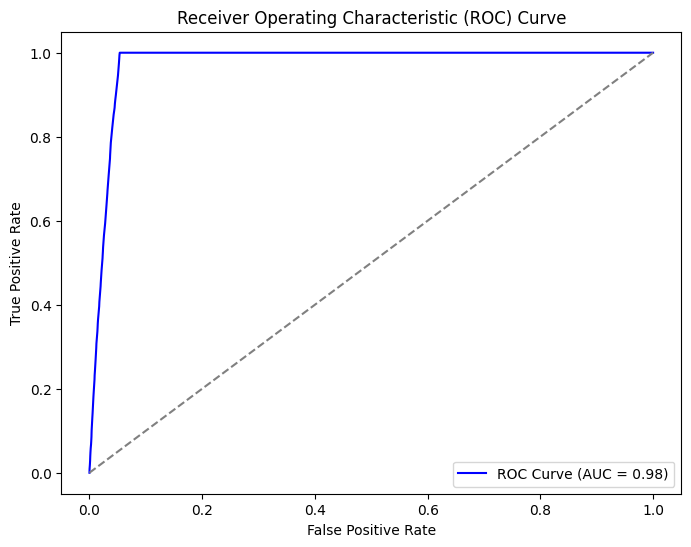

In [86]:

y_probs = clf.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_probs)
print(f"ROC-AUC Score: {roc_auc:.2f}")

fpr, tpr, _ = roc_curve(y_test, y_probs)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})", color='blue')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.show()

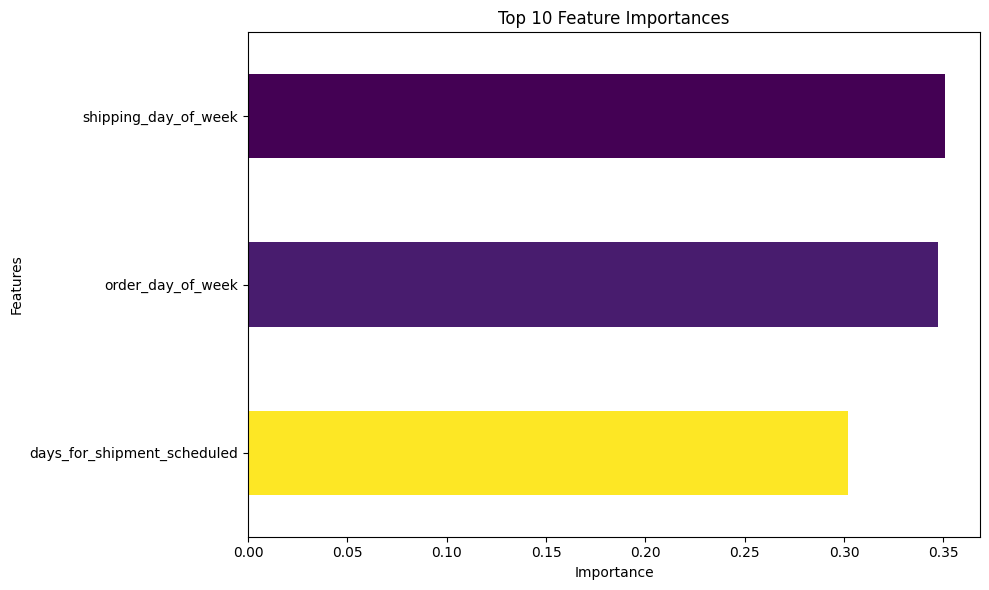

In [87]:
feature_importances = pd.Series(clf.feature_importances_, index=features.columns).nlargest(20).sort_values()

plt.figure(figsize=(10, 6))
cmap = plt.cm.viridis_r
colors = cmap((feature_importances - feature_importances.min()) / (feature_importances.max() - feature_importances.min()))
feature_importances.plot(kind='barh', color=colors)
plt.title("Top 10 Feature Importances")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

In [88]:
import pickle

# Save the model to a file
with open('random_forest_model.pkl', 'wb') as f:
    pickle.dump(clf, f)
